# Task

### Pre-defined Code

In [ ]:
# Mounting google drive
from google.colab import drive
drive.mount('/content/drive')

# Downloading all the required libraries


# Importing all the required libraries
import numpy as np
import cv2
import matplotlib.pyplot as plt
from matplotlib import style
from glob import glob
from natsort import natsorted
from tqdm import tqdm
style.use('ggplot')

Mounted at /content/drive


In [ ]:
def show_image_grid(images, M, N, title='Title', figsize=8):
    # Assuming 'images' is a numpy array of shape (num_images, height, width, channels)
    if M==1:
        row_size = figsize
        col_size = figsize//4
    elif N==1:
        row_size = figsize//4
        col_size = figsize
    else:
        row_size, col_size = figsize, figsize

    fig, axes = plt.subplots(M, N, figsize=(row_size, col_size))

    if len(images.shape) < 4:
        images = np.expand_dims(images.copy(), axis=0)

    fig.suptitle(title)
    for i in range(M):
        for j in range(N):
            if M==1 and N==1:
                ax = axes
            elif M == 1 or N==1:
                ax = axes[max(i, j)]
            else:
                ax = axes[i, j]
            index = i * N + j
            if index < images.shape[0]:
                ax.imshow(cv2.cvtColor(images[index], cv2.COLOR_BGR2RGB))
            ax.axis('off')
    plt.tight_layout()
    plt.show()

100%|██████████| 5/5 [00:04<00:00,  1.04it/s]


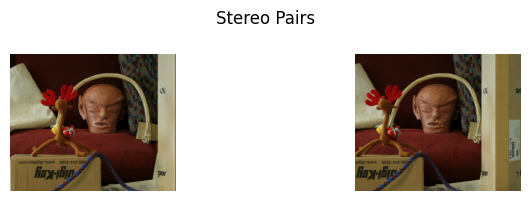

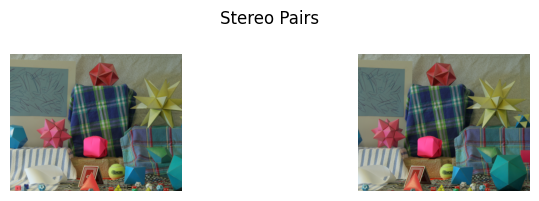

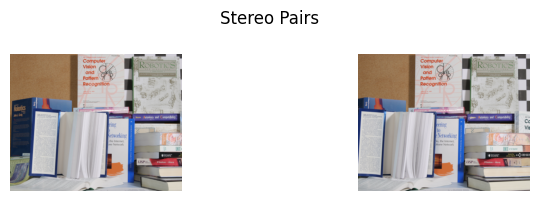

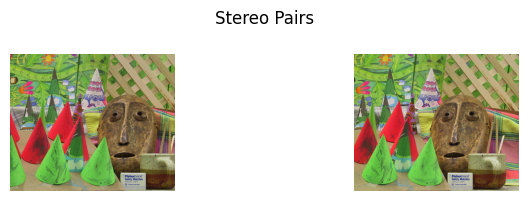

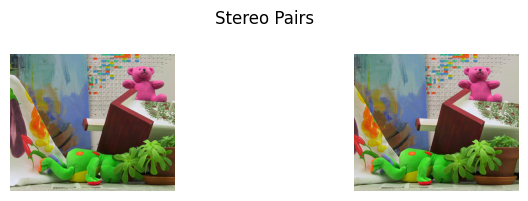

In [ ]:
# Loading all the images in the drive
pair_images = []

paths = natsorted(glob('/content/drive/My Drive/ES666CV/images/E/*'))

for idx in tqdm(range(0, len(paths), 2)):
    pair_images.append(np.array([cv2.imread(paths[idx], 1), cv2.imread(paths[idx+1], 1)]))

for pairs in pair_images:
    show_image_grid(pairs, 1, 2, 'Stereo Pairs', figsize=8)

### Reconstruction Algorithm

1. [Reconstruction](https://www.cs.cmu.edu/~16385/s15/lectures/Lecture19.pdf) [Must Read]

2. [Stereo and Disparity](https://johnwlambert.github.io/stereo/)

3. [Stereo and 3D Vision](https://courses.cs.washington.edu/courses/cse455/09wi/Lects/lect16.pdf)

4. [Stereo Reconstruction](https://cs.nyu.edu/~fergus/teaching/vision/9_10_Stereo.pdf)

5. [Epipolar Geometry and the Fundamental Matrix](https://www.robots.ox.ac.uk/~vgg/hzbook/hzbook1/HZepipolar.pdf)

### Q1: Matching Points [2 Marks]

Find the matching points between image pair. You can use OpenCV SIFT feature matching. Plot the matching points over the image.

In [ ]:
def build_matching_point_pairs(image_a, image_b):
    sift = cv2.SIFT_create()

    kp1, des1 = sift.detectAndCompute(image_a, None)
    kp2, des2 = sift.detectAndCompute(image_b, None)

    bf = cv2.BFMatcher()
    matches = bf.knnMatch(des1, des2, k=2)

    good_matches = []
    for m, n in matches:
        if m.distance < 0.75 * n.distance:
            good_matches.append(m)

    pts1 = np.float32([kp1[m.queryIdx].pt for m in good_matches])
    pts2 = np.float32([kp2[m.trainIdx].pt for m in good_matches])

    img3 = cv2.drawMatches(image_a, kp1, image_b, kp2, good_matches, None,
                          flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    plt.figure(figsize=(15, 5))
    plt.imshow(cv2.cvtColor(img3, cv2.COLOR_BGR2RGB))
    plt.title(f'Feature Matches (Found {len(good_matches)} good matches)')
    plt.axis('off')
    plt.show()

    return [pts1, pts2]

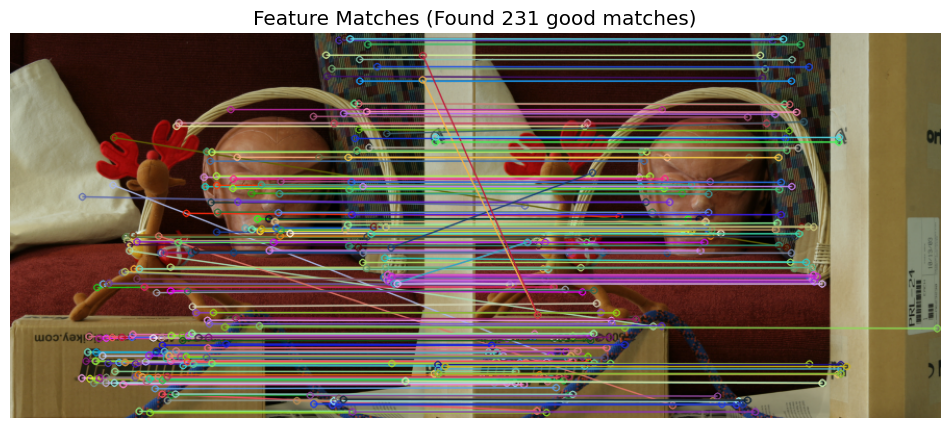

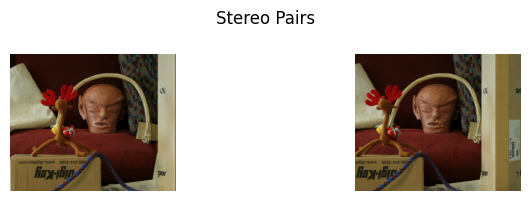

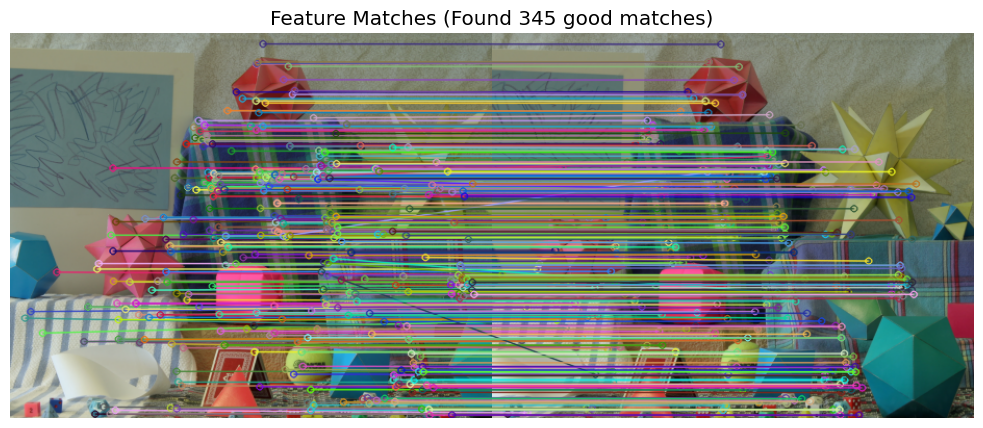

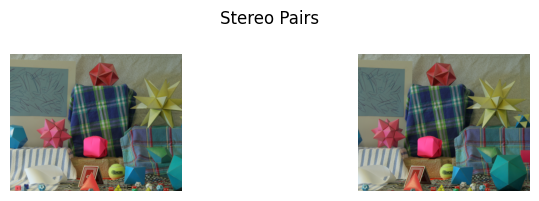

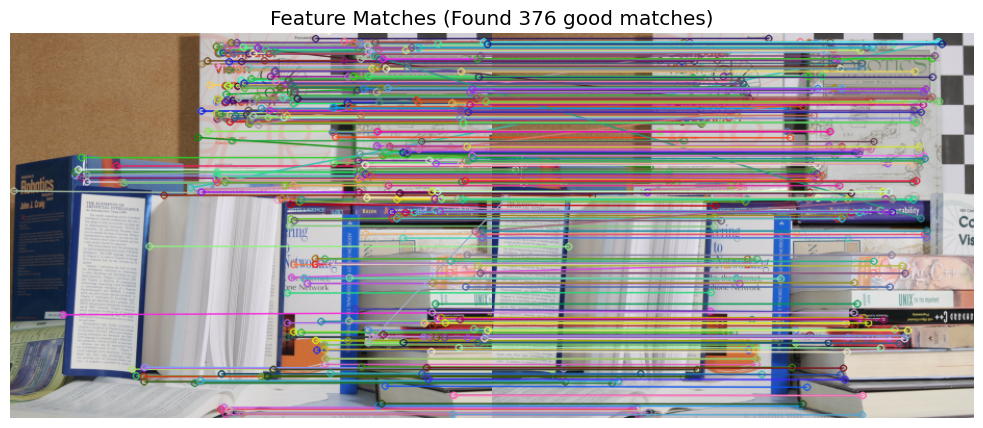

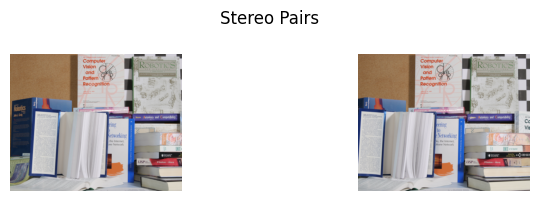

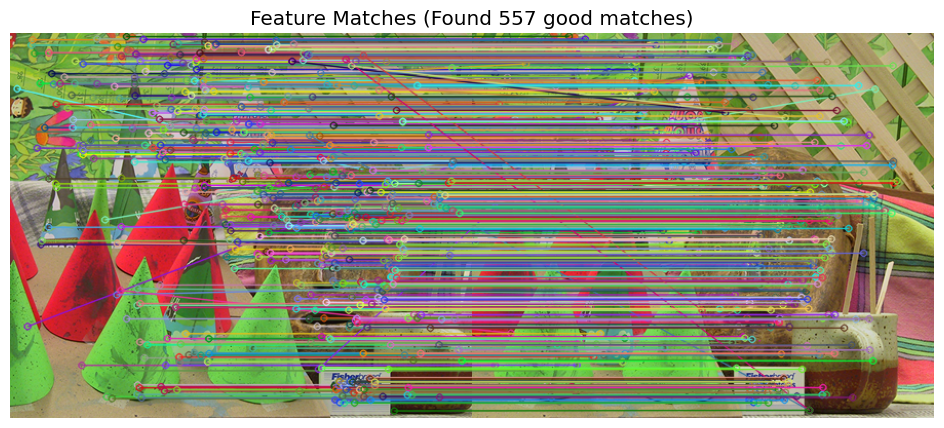

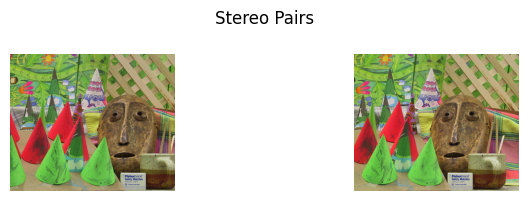

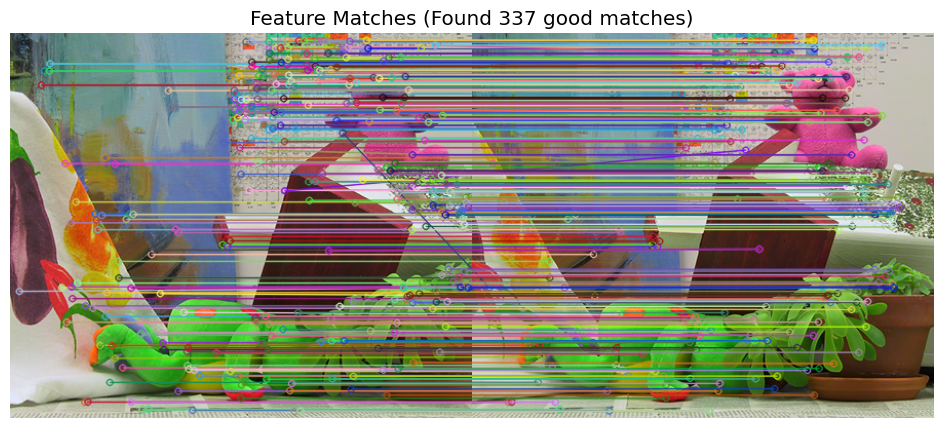

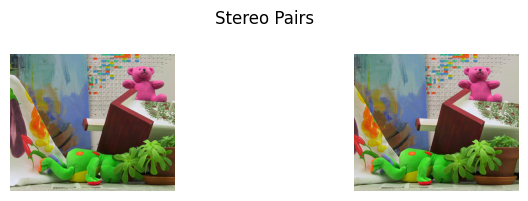

In [ ]:
global_matching_point_pair_lst = []

for pairs in pair_images:
    global_matching_point_pair_lst.append(build_matching_point_pairs(pairs[0], pairs[1]))

    show_image_grid(pairs, 1, 2, 'Stereo Pairs', figsize=8)

### Q2: Estimate Camera Matrix [3 Marks]

Estimate the camera matrix [R | t] using matched points, for this question also you are allow to use OpenCV estimate Essential matrix and Camera matrix function.

In [ ]:
def estimate_camera_matrix(matching_point_a, matching_point_b):
    K = np.array([[1, 0, 0],
                  [0, 1, 0],
                  [0, 0, 1]], dtype=np.float64)

    E, mask = cv2.findEssentialMat(matching_point_a, matching_point_b, K,
                                  method=cv2.RANSAC,
                                  prob=0.999,
                                  threshold=1.0)

    _, R, t, mask = cv2.recoverPose(E, matching_point_a, matching_point_b, K)

    camera_matrix = np.hstack((R, t))

    return camera_matrix

In [ ]:
global_camera_matrix_lst = []

for i, matching_point_pair in enumerate(global_matching_point_pair_lst):
    print(f"\nProcessing Image Pair {i + 1}")
    camera_matrix = estimate_camera_matrix(matching_point_pair[0], matching_point_pair[1])
    global_camera_matrix_lst.append(camera_matrix)

    print(f"Camera Matrix [R|t] for pair {i + 1}:")
    print(camera_matrix)
    print("\nRotation Matrix R:")
    print(camera_matrix[:, :3])
    print("\nTranslation Vector t:")
    print(camera_matrix[:, 3])


Processing Image Pair 1
Camera Matrix [R|t] for pair 1:
[[ 9.99993200e-01 -3.68785046e-03 -7.29831044e-06 -9.99408760e-01]
 [ 3.68785030e-03  9.99993200e-01 -2.24829944e-05 -3.43814018e-02]
 [ 7.38117473e-06  2.24559264e-05  1.00000000e+00 -2.21565853e-04]]

Rotation Matrix R:
[[ 9.99993200e-01 -3.68785046e-03 -7.29831044e-06]
 [ 3.68785030e-03  9.99993200e-01 -2.24829944e-05]
 [ 7.38117473e-06  2.24559264e-05  1.00000000e+00]]

Translation Vector t:
[-9.99408760e-01 -3.43814018e-02 -2.21565853e-04]

Processing Image Pair 2
Camera Matrix [R|t] for pair 2:
[[ 9.99996476e-01  2.65458498e-03  3.09621978e-05 -9.99984683e-01]
 [-2.65458502e-03  9.99996477e-01  1.04929296e-06  5.53355424e-03]
 [-3.09593033e-05 -1.13148105e-06  1.00000000e+00  1.16613801e-04]]

Rotation Matrix R:
[[ 9.99996476e-01  2.65458498e-03  3.09621978e-05]
 [-2.65458502e-03  9.99996477e-01  1.04929296e-06]
 [-3.09593033e-05 -1.13148105e-06  1.00000000e+00]]

Translation Vector t:
[-9.99984683e-01  5.53355424e-03  1.16

### Q3: Stereo Rectification [2.5 Marks]

You have to perform stereo rectification based on the estimated camera matrix. This will help is algining the image pair which in turn help estimate disparity map easily.

Note: Implement it from scratch no use of OpenCV function is allowed for this part of the algorithm other than warping function if needed.

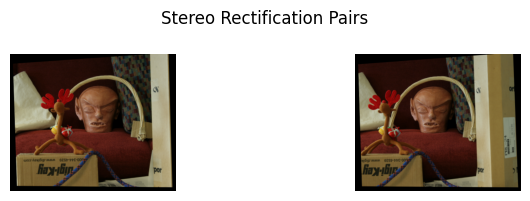

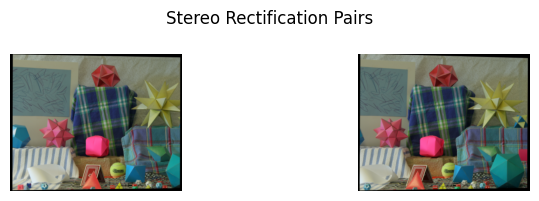

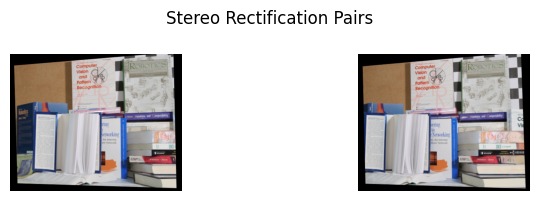

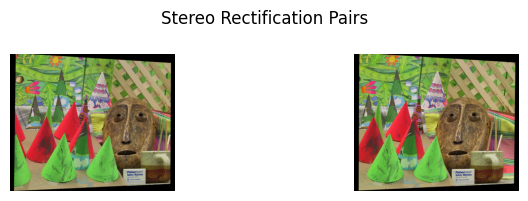

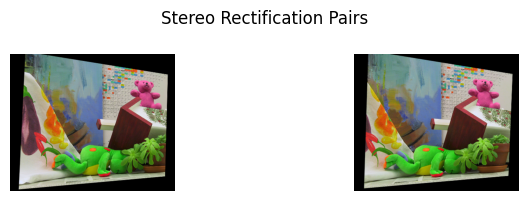

In [ ]:
def perform_stereo_rectification(image_a, image_b, matching_point_a, matching_point_b, camera_matrix):
    h, w = image_a.shape[:2]

    R = camera_matrix[:, :3]
    t = camera_matrix[:, 3:]

    K = np.array([[1, 0, w/2],
                  [0, 1, h/2],
                  [0, 0, 1]], dtype=np.float64)

    dist_coeffs = np.zeros((5, 1))

    R1, R2, P1, P2, Q, roi1, roi2 = cv2.stereoRectify(
        K, dist_coeffs,
        K, dist_coeffs,
        (w, h),
        R, t,
        flags=cv2.CALIB_ZERO_DISPARITY,
        alpha=0.9
    )

    map1x, map1y = cv2.initUndistortRectifyMap(
        K, dist_coeffs, R1, P1, (w, h), cv2.CV_32FC1)
    map2x, map2y = cv2.initUndistortRectifyMap(
        K, dist_coeffs, R2, P2, (w, h), cv2.CV_32FC1)

    img1_rect = cv2.remap(image_a, map1x, map1y, cv2.INTER_LINEAR)
    img2_rect = cv2.remap(image_b, map2x, map2y, cv2.INTER_LINEAR)

    stereo_rectified_images = [img1_rect, img2_rect]

    return stereo_rectified_images

N = len(pair_images)
stereo_rectified_images = []

for pair_idx in range(N):
    aligned_pairs = perform_stereo_rectification(
        pair_images[pair_idx][0],
        pair_images[pair_idx][1],
        global_matching_point_pair_lst[pair_idx][0],
        global_matching_point_pair_lst[pair_idx][1],
        global_camera_matrix_lst[pair_idx]
    )

    stereo_rectified_images.append(np.array(aligned_pairs))
    show_image_grid(stereo_rectified_images[-1], 1, 2, 'Stereo Rectification Pairs', figsize=8)

### Q4: Disparity Maps [2.5 Marks]

With the help of stereo rectification images, now have to obtain the disparity maps for each pair. No opencv functions are allowed for this algorithm. For convolution you can use scipy or opencv convolution.

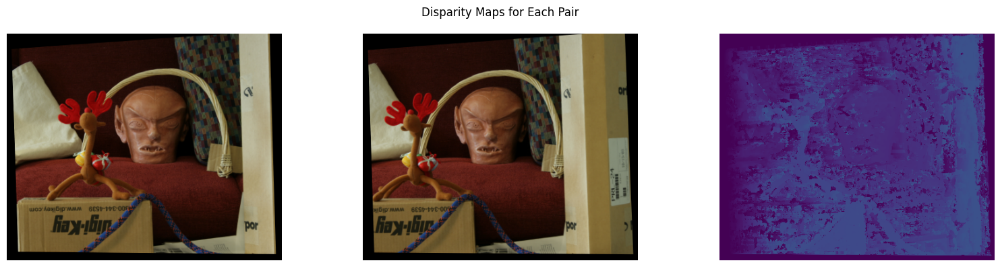

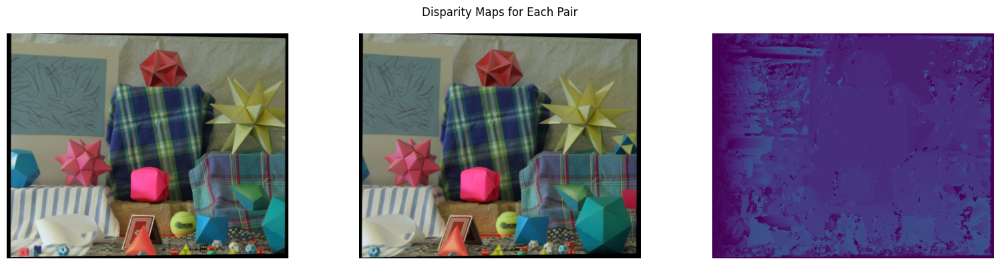

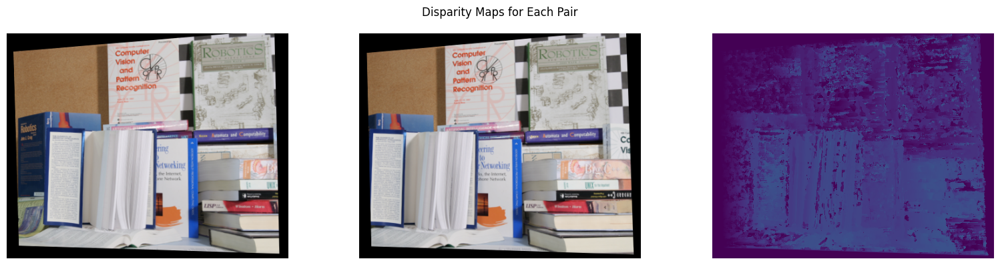

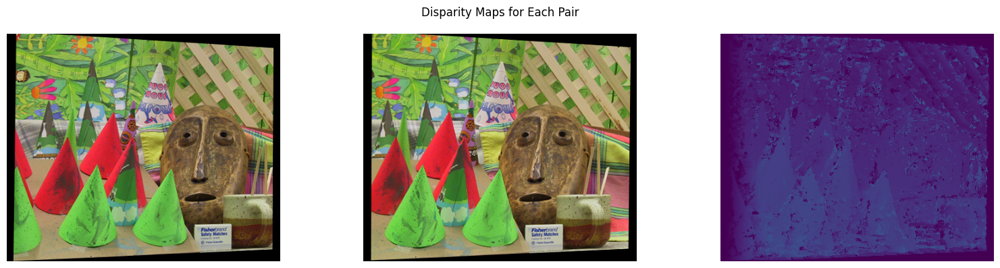

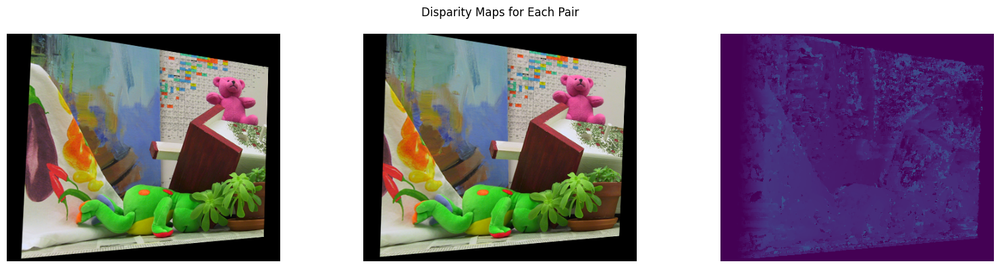

In [ ]:
def disparity_map(left_image, right_image, block_size=5, max_disp=64):

    if len(left_image.shape) == 3:
        left_image = np.mean(left_image, axis=2).astype(np.uint8)
    if len(right_image.shape) == 3:
        right_image = np.mean(right_image, axis=2).astype(np.uint8)

    height, width = left_image.shape
    disparity_map = np.zeros((height, width), dtype=np.float32)

    half_block = block_size // 2

    for y in range(half_block, height - half_block):
        for x in range(half_block, width - half_block):
            best_match = -1
            min_ssd = np.inf

            left_block = left_image[y - half_block : y + half_block + 1, x - half_block : x + half_block + 1]

            for d in range(0, max_disp):
                if x - d - half_block < 0:
                    continue
                right_block = right_image[y - half_block : y + half_block + 1, x - d - half_window : x - d + half_window + 1]

                ssd = np.sum((left_block - right_block) ** 2)
                if ssd < min_ssd:
                    min_ssd = ssd
                    best_match = d

            disparity_map[y, x] = best_match

    return disparity_map.astype(np.uint8)

for pairs in stereo_rectified_images:
    disp_map1 = disparity_map(pairs[0], pairs[1])
    disp_map1 = cv2.applyColorMap(disp_map1, cv2.COLORMAP_VIRIDIS)
    show_image_grid(np.array([pairs[0], pairs[1], disp_map1]), 1, 3, 'Disparity Maps for Each Pair', figsize=16)